# Sysnav test

The following code concerns the following challenge for sysnav Deep Learning internship : https://drive.google.com/file/d/17FGm9ByJ3mVnRotSSe6hm4_cfdOEAGzz/view?usp=sharing

It is executable, but all the results are already available so all the training phases don't have to be done by the reader.

##Libraries imports and data importation

In [ ]:
!pip install apriltag

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import apriltag
import cv2
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from google.colab import files

from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers.experimental import preprocessing

The following cell downloads a python file containing functions that will help us allong the way. This functions are a mix of self made ones and other coming from an external Tensorflow course.

In [ ]:
!wget https://raw.githubusercontent.com/asmkwo/Useful-.py-files/main/cv_helper_functions.py

--2023-05-09 17:02:36--  https://raw.githubusercontent.com/asmkwo/Useful-.py-files/main/cv_helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13077 (13K) [text/plain]
Saving to: ‘cv_helper_functions.py.1’

cv_helper_functions 100%[===================>]  12.77K  --.-KB/s    in 0s      

2023-05-09 17:02:36 (62.3 MB/s) - ‘cv_helper_functions.py.1’ saved [13077/13077]



In [ ]:
from cv_helper_functions import plot_loss_curves, unzip_data

The following cells enable to mount google drive to load data from there.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


The following path should be replaced with the path where the "images" directory is located.

In [ ]:
unzip_data("/content/drive/MyDrive/Programmation/Sysnav challenge/Perso/images.zip")

In [ ]:
image_folder_path = "/content/images"

## Creating training dataset using apriltag library

We will be using the apriltag library to detect the tags in the images. The apriltag Detector detects the tags in a given image and returns the tag's corners coordinates. These coordinates are then saved in a pandas dataframe.

If no tag is detected, the corners coordinates will be filled with zeros instead.

In [ ]:
#defining the columns and creating the dataframe
columns = ['image_id','upper_left_x', 'upper_left_y', 'upper_right_x', 'upper_right_y', 'lower_right_x', 'lower_right_y', 'lower_left_x', 'lower_left_y']
apriltag_df = pd.DataFrame(columns=columns)

#instanciating apriltag detector
detector = apriltag.Detector()

# Going throught all the folder files
for filename in os.listdir(image_folder_path):
    # Checking file is a png image
    if filename.endswith('.png'):
        image_path = os.path.join(image_folder_path, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        detections = detector.detect(image)
        if detections :
            corners = detections[0].corners
            apriltag_df.loc[len(apriltag_df)] = [filename,corners[0][0],corners[0][1],corners[1][0],corners[1][1],corners[2][0],corners[2][1],corners[3][0],corners[3][1]]
        else : #if no tag is detected
           apriltag_df.loc[len(apriltag_df)] = [filename, 0,0,0,0,0,0,0,0]

In [ ]:
apriltag_df.tail()

,image_id,upper_left_x,upper_left_y,upper_right_x,upper_right_y,lower_right_x,lower_right_y,lower_left_x,lower_left_y
3777,img_001698.png,327.137360,169.934250,365.986664,172.505768,365.628937,211.236359,326.945648,209.600479
3778,img_001342.png,322.589020,139.673355,415.289490,140.391403,425.870270,230.766663,328.718109,235.768478
3779,img_002045.png,158.738937,183.554733,171.026352,180.907623,172.568527,194.044968,159.895477,196.609314
3780,img_002029.png,55.094688,184.642120,65.851761,182.846817,66.394203,195.248734,56.148659,197.232834
3781,img_001824.png,476.737915,144.760178,530.286987,153.613831,536.737732,220.411377,483.943115,219.072311


Note that depending on the type of execution (None or GPU), the order in which the image are stored in the dataframe may vary

We are required for this test to provide a csv format of the dataframe.
Execute the folloing cells to download the csv on local device.

In [ ]:
apriltag_df_csv = apriltag_df.to_csv('apriltags_corners.csv', index=False)

In [ ]:
# Download the CSV file from Colab to your local machine
files.download('apriltags_corners.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##Deep Learning

For this task we will be fine tuning the ResNe50 model trained on imagenet. This model was used as it performances have proven to be decent on QRcode detection, as mentionned in [this paper](https://www.researchgate.net/publication/335538522_An_Evaluation_of_Deep_Learning_Techniques_for_Qr_Code_Detection).

###Preprocessing data

As we are using ResNet50, we must provide images of shape (224,224) as an input.

The following function simply preprocesses our image and prepares them for our CNN.

In [ ]:
def load_and_preprocess_image(image_filename, for_display=False):
    image_string = tf.io.read_file(image_filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.resize(image, [224, 224])
    image = tf.cast(image, tf.float32) / 255.0  # Normalize pixel values between 0 and 1
    if not for_display : #no need to expand the dimension for displaying purposes with plt.imshow
      image = tf.expand_dims(image, axis=0)
    return image

As it is always good to see what we are working with, here is a quick view of an image once it has been preprocessed.

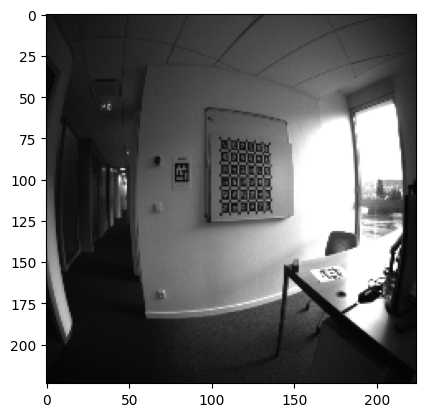

In [ ]:
plt.imshow(load_and_preprocess_image('/content/images/img_002112.png', for_display=True))

The first step consists in normalizing our pixel values so they range from 0 to 1.

In [ ]:
HEIGHT = 540
WIDTH = 720

In [ ]:
apriltag_df_normalized = apriltag_df.copy()

apriltag_df_normalized['upper_left_x']/=WIDTH
apriltag_df_normalized['upper_right_x']/=WIDTH
apriltag_df_normalized['lower_right_x']/=WIDTH
apriltag_df_normalized['lower_left_x']/=WIDTH

apriltag_df_normalized['upper_left_y']/=HEIGHT
apriltag_df_normalized['upper_right_y']/=HEIGHT
apriltag_df_normalized['lower_right_y']/=HEIGHT
apriltag_df_normalized['lower_left_y']/=HEIGHT

apriltag_df_normalized.tail()

,image_id,upper_left_x,upper_left_y,upper_right_x,upper_right_y,lower_right_x,lower_right_y,lower_left_x,lower_left_y
3777,img_001698.png,0.454357,0.314693,0.508315,0.319455,0.507818,0.391178,0.454091,0.388149
3778,img_001342.png,0.448040,0.258654,0.576791,0.259984,0.591486,0.427346,0.456553,0.436608
3779,img_002045.png,0.220471,0.339916,0.237537,0.335014,0.239679,0.359343,0.222077,0.364091
3780,img_002029.png,0.076520,0.341930,0.091461,0.338605,0.092214,0.361572,0.077984,0.365246
3781,img_001824.png,0.662136,0.268074,0.736510,0.284470,0.745469,0.408169,0.672143,0.405689


**IMPORTANT**

I have done many trials for predicting 8 pixels values, but the performance I obtained waas really poor.
As a consequence I have chosen to modify the dataset, so our network is trained to predict only 4 values, which are the lowest and highest x and y pixel values.

This still returns a bounding box that is pretty accurate, given that our images aren't particularly tilted.

In [ ]:
#creating two separate dataframes, one with all x values and the other with all y values
apriltag_df_x_values =  apriltag_df_normalized.drop(['upper_left_y','upper_right_y','lower_right_y','lower_left_y'], axis = 1)
apriltag_df_y_values =  apriltag_df_normalized.drop(['upper_left_x','upper_right_x','lower_right_x','lower_left_x'], axis = 1)

This was done is order to compute the min and the max of both x and y values.

In [ ]:
#comuting min and max x
apriltag_df_x_min_max_no_id = pd.DataFrame({'min_x': apriltag_df_x_values.iloc[:, 1:].min(axis=1), 'max_x': apriltag_df_x_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_x_min_max = pd.concat([apriltag_df_x_values['image_id'], apriltag_df_x_min_max_no_id], axis=1)

#for visualization purposes
apriltag_df_x_min_max.tail()

,image_id,min_x,max_x
3777,img_001698.png,0.454091,0.508315
3778,img_001342.png,0.448040,0.591486
3779,img_002045.png,0.220471,0.239679
3780,img_002029.png,0.076520,0.092214
3781,img_001824.png,0.662136,0.745469


In [ ]:
#comuting min and max y
apriltag_df_y_min_max_no_id = pd.DataFrame({'min_y': apriltag_df_y_values.iloc[:, 1:].min(axis=1), 'max_y': apriltag_df_y_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_y_min_max = pd.concat([apriltag_df_y_values['image_id'], apriltag_df_y_min_max_no_id], axis=1)

Now that our min and max values have been selected, we can create our 4 columns dataframe.

In [ ]:
apriltag_df_xy_min_max = pd.concat([apriltag_df_x_min_max, apriltag_df_y_min_max.iloc[:, 1:]],axis=1)
apriltag_df_xy_min_max.head()

,image_id,min_x,max_x,min_y,max_y
0,img_001112.png,0.299559,0.325806,0.376363,0.438293
1,img_003514.png,0.386410,0.538044,0.316507,0.518126
2,img_002261.png,0.404976,0.662991,0.330395,0.670540
3,img_000046.png,0.000000,0.000000,0.000000,0.000000
4,img_001850.png,0.570228,0.653385,0.315352,0.427568


Now we need to separate ouor data into train and test images, and then use *ImageDataGenerator* and the *flow_from_dataframe* method to create an appropiate training and testing dataset for our network.

In [ ]:
# Split the dataset into training and validation sets
train_data, val_data = train_test_split(apriltag_df_xy_min_max, test_size=0.2)

# Define a data generator that generates batches of training and validation data
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_data,
    directory= image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

Found 3025 validated image filenames.
Found 757 validated image filenames.


###Create the model

Using ResNet50 because of [this paper](https://www.researchgate.net/publication/335538522_An_Evaluation_of_Deep_Learning_Techniques_for_Qr_Code_Detection) about QR code detection. Results obtained seem good and QR codes are similar to Apriltags.

In [ ]:
# Load a pre-trained ResNet50 model
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
base_model.trainable = False

#creating input layer
inputs = tf.keras.layers.Input(shape = (224,224,3), name = "input layer")

#building the model's architecture
x = base_model(inputs, training = False)
x = tf.keras.layers.Flatten()(x)

# Add a new regression layer to the model that outputs the predicted bounding box coordinates
x = Dense(4, activation='linear')(x)

# Create the final model
model = Model(inputs=inputs, outputs=x)

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
#compile the model
model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=0.001), metrics=['accuracy','mse'])

*mse* and *accuracy* have been chosen as they are good performance indicators for regression problems.

In [ ]:
#train the model
history = model.fit(train_generator, epochs=5, validation_data=val_generator)

Epoch 1/5
95/95 [==============================] - 35s 243ms/step - loss: 5.2236 - accuracy: 0.2952 - mse: 5.2236 - val_loss: 0.0703 - val_accuracy: 0.3157 - val_mse: 0.0703
Epoch 2/5
95/95 [==============================] - 21s 223ms/step - loss: 0.0459 - accuracy: 0.3785 - mse: 0.0459 - val_loss: 0.0307 - val_accuracy: 0.3884 - val_mse: 0.0307
Epoch 3/5
95/95 [==============================] - 22s 228ms/step - loss: 0.0282 - accuracy: 0.4516 - mse: 0.0282 - val_loss: 0.0228 - val_accuracy: 0.3844 - val_mse: 0.0228
Epoch 4/5
95/95 [==============================] - 22s 228ms/step - loss: 0.0213 - accuracy: 0.4840 - mse: 0.0213 - val_loss: 0.0210 - val_accuracy: 0.3540 - val_mse: 0.0210
Epoch 5/5
95/95 [==============================] - 21s 221ms/step - loss: 0.0164 - accuracy: 0.5038 - mse: 0.0164 - val_loss: 0.0188 - val_accuracy: 0.3355 - val_mse: 0.0188


Let's plot the loss and accuracy curves to evaluate the performance of our model.

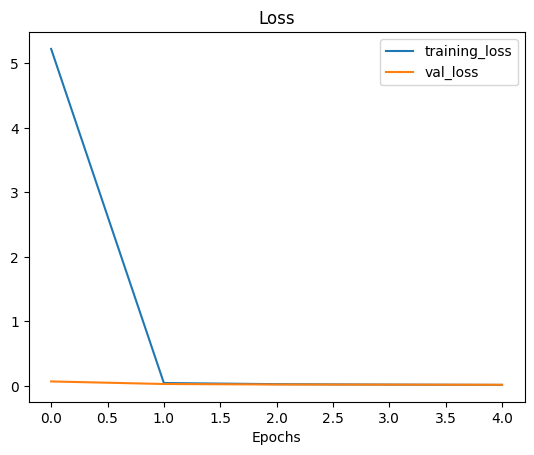

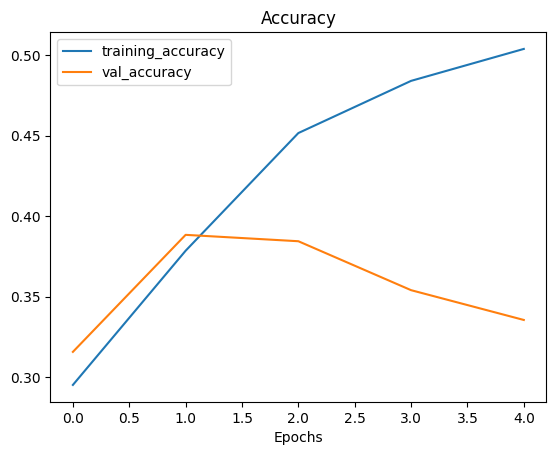

In [ ]:
plot_loss_curves(history)

These curves are not truly satisfying :
The validation accuracy is decreasing while the training accuracy is increasing, which means we have probably induced some overfitting.

**IMPORTANT** At the end of the notebook there is a section called *First ResNet50 implementation*, which was my first try and gave way better results. Because of the fact in don't have access to GPUs anymore in colab, I haven't been able to do many attempts to retrieve these results.

This results are better and the reader should have a look at it in order to understand why I tried to pursue this model and go further with it, in the *Upgrading the model* section.

Let's select a random image containing a Apriltag and see what what our model predicts. (I have tried with different random images and the one selected is reprentative of the prediction obtained).

In [ ]:
#selecting a random image
image_test = load_and_preprocess_image('/content/images/img_000482.png', True)

#making a prediction
prediction = model.predict(np.array([image_test]))

#de-normalizing the predicted pixel values
prediction[0][0] *=WIDTH
prediction[0][1] *=WIDTH
prediction[0][2] *=HEIGHT
prediction[0][3] *=HEIGHT

1/1 [==============================] - 2s 2s/step


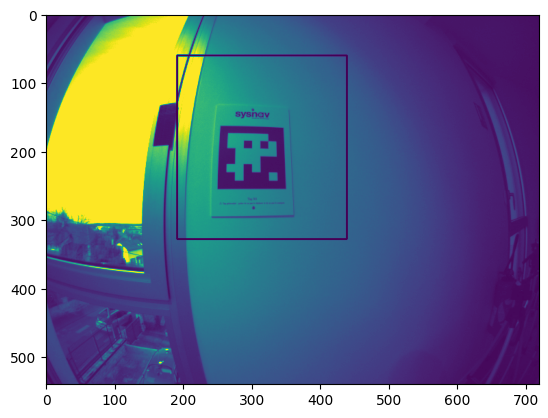

In [ ]:
img = cv2.imread('/content/images/img_000482.png', cv2.IMREAD_GRAYSCALE)
# Draw the bounding box on the image
xmin, ymin, xmax, ymax = prediction[0][0], prediction[0][2], prediction[0][1], prediction[0][3]
cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)

# Display the image
plt.imshow(img)
plt.show()

This is not the result that is expected as the bounding box isn't precise, but at least it contains the Apriltag which proves some improvment can be made.

###Upgrading the model

Our model performance is quite poor and should be increased.

As the task asks to keep the same model, here are a few ways we can improve it :
* undistort the image
* data augmentation
* fine tuning

As the training is very time consuming and the colab is very tricky to train for a long time, the following cells won"t be executed. Also, a lot of cells will be similar to previous ones. The reader will be notified with a #SEEN at the beginning of the cell.

Howerver, the new information will be explained and detailed.


#### Undistort the images

First of all in order to improve our result we will try to undistort our images using the camera instrinsic parameters provided :

In [ ]:
fx = 318.9770
fy = 318.7014
cx, cy = 350.59, 271.18
tangential_distortion_coefficients = 0.0015200349370581298
p1, p2 = tangential_distortion_coefficients, tangential_distortion_coefficients
k1 = -0.01821773115929867
k2 = -0.006822037702469422
k3 = -0.0009332407055142363

Only k1, k2, k3 and k4 have been provided. The OpenCV undistort() function requires tangential distortion coefficients p1 and p2, which are not provided.

I assumed they might have been an error, or there is something i misunderstood. I made the hypothesis that p1 = p2, and that the coefficients where provided in the order that they appear in the undistort() arguments.

As a consequence :
* k1 = k1
* k2 = k2
* p1 & p2 = k3
* k3 = k4

I have runned many tests tying different combinations, but as coefficient are small, it didn,t make a significant difference.

With more time we could get the intrinsic parameters of the camera given the fact that the image dataset contains a chessboard images.

In [ ]:
# Define the camera matrix and distortion coefficients
camera_matrix = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])
dist_coeffs = np.array([k1, k2, p1, p2, k3])

Now we can recreate a dataframe as we did previously, only this time itt will be created using undistorted images.

In [ ]:
#SEEN
#defining the columns and creating the dataframe
columns = ['image_id','upper_left_x', 'upper_left_y', 'upper_right_x', 'upper_right_y', 'lower_right_x', 'lower_right_y', 'lower_left_x', 'lower_left_y']
apriltag_df_undistorted = pd.DataFrame(columns=columns)

#instanciating apriltag detector
detector = apriltag.Detector()

# Going throught all the folder files
for filename in os.listdir(image_folder_path):
    # Checking file is a png image
    if filename.endswith('.png'):
        image_path = os.path.join(image_folder_path, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        #undistorting image
        undistorted_image = cv2.undistort(image, camera_matrix, dist_coeffs) # <---- added line

        detections = detector.detect(image)
        if detections :
            corners = detections[0].corners
            apriltag_df_undistorted.loc[len(apriltag_df_undistorted)] = [filename, corners[0][0],corners[0][1],corners[1][0],corners[1][1],corners[2][0],corners[2][1],corners[3][0],corners[3][1]]
        else : #if no tag is detected
           apriltag_df_undistorted.loc[len(apriltag_df_undistorted)] = [filename, 0,0,0,0,0,0,0,0]

In [ ]:
apriltag_df_normalized = apriltag_df_undistorted.copy()

apriltag_df_normalized['upper_left_x']/=WIDTH
apriltag_df_normalized['upper_right_x']/=WIDTH
apriltag_df_normalized['lower_right_x']/=WIDTH
apriltag_df_normalized['lower_left_x']/=WIDTH

apriltag_df_normalized['upper_left_y']/=HEIGHT
apriltag_df_normalized['upper_right_y']/=HEIGHT
apriltag_df_normalized['lower_right_y']/=HEIGHT
apriltag_df_normalized['lower_left_y']/=HEIGHT

apriltag_df_normalized.head()

,image_id,upper_left_x,upper_left_y,upper_right_x,upper_right_y,lower_right_x,lower_right_y,lower_left_x,lower_left_y
0,img_001112.png,0.301697,0.376363,0.325806,0.383811,0.324528,0.438293,0.299559,0.435116
1,img_003514.png,0.386410,0.372044,0.496669,0.316507,0.538044,0.461446,0.429039,0.518126
2,img_002261.png,0.404976,0.361640,0.629694,0.330395,0.662991,0.637965,0.420647,0.670540
3,img_000046.png,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,img_001850.png,0.570228,0.315352,0.646274,0.318638,0.653385,0.425115,0.576894,0.427568


In [ ]:
apriltag_df_x_values =  apriltag_df_normalized.drop(['upper_left_y','upper_right_y','lower_right_y','lower_left_y'], axis = 1)
apriltag_df_y_values =  apriltag_df_normalized.drop(['upper_left_x','upper_right_x','lower_right_x','lower_left_x'], axis = 1)

In [ ]:
#computing min and max x
apriltag_df_x_min_max_no_id = pd.DataFrame({'min_x': apriltag_df_x_values.iloc[:, 1:].min(axis=1), 'max_x': apriltag_df_x_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_x_min_max = pd.concat([apriltag_df_x_values['image_id'], apriltag_df_x_min_max_no_id], axis=1)

#for visualization purposes
apriltag_df_x_min_max.head()

,image_id,min_x,max_x
0,img_001112.png,0.299559,0.325806
1,img_003514.png,0.386410,0.538044
2,img_002261.png,0.404976,0.662991
3,img_000046.png,0.000000,0.000000
4,img_001850.png,0.570228,0.653385


In [ ]:
#computing min and max y
apriltag_df_y_min_max_no_id = pd.DataFrame({'min_y': apriltag_df_y_values.iloc[:, 1:].min(axis=1), 'max_y': apriltag_df_y_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_y_min_max = pd.concat([apriltag_df_y_values['image_id'], apriltag_df_y_min_max_no_id], axis=1)

In [ ]:
apriltag_df_xy_min_max = pd.concat([apriltag_df_x_min_max, apriltag_df_y_min_max.iloc[:, 1:]],axis=1)
apriltag_df_xy_min_max.head()

,image_id,min_x,max_x,min_y,max_y
0,img_001112.png,0.299559,0.325806,0.376363,0.438293
1,img_003514.png,0.386410,0.538044,0.316507,0.518126
2,img_002261.png,0.404976,0.662991,0.330395,0.670540
3,img_000046.png,0.000000,0.000000,0.000000,0.000000
4,img_001850.png,0.570228,0.653385,0.315352,0.427568


In [ ]:
# Split the dataset into training and validation sets
train_data, val_data = train_test_split(apriltag_df_xy_min_max, test_size=0.2)

# Define a data generator that generates batches of training and validation data
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_data,
    directory= image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

Found 3025 validated image filenames.
Found 757 validated image filenames.


#### Data augmentation

In order to help our model generalize better, we can add data augmentation built in our model.
As a consequence, we create a data augmentation layer that we will pass into our model when redefining its architecture :

In [ ]:
# Create a data augmentation stage with horizontal flipping, rotations, zooms
data_augmentation = tf.keras.Sequential([
  preprocessing.RandomFlip("horizontal"),
  preprocessing.RandomRotation(0.2),
  preprocessing.RandomZoom(0.2),
  preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
],  name = "data_augmentation")

####Fine tuning
Finally, we can unfreeze some of the underlying layers of our model to help it learn better patterns in our data.
This could be efficient here as our model was trained on imagenet, and the patterns it has learned to detect are not similar to the ones that accuratly describe apriltags.

In [ ]:
# Load a pre-trained ResNet50 model
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))


#creating input layer
inputs = tf.keras.layers.Input(shape = (224,224,3), name = "input layer")
x = data_augmentation(inputs)

# Make our last 5 layers trainable
base_model.trainable = True
for layer in base_model.layers[:-5]:
  layer.trainable = False

#building the model's architecture
x = base_model(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Add a new regression layer to the model that outputs the predicted bounding box coordinates
x = Dense(4, activation='linear')(x)

# Create the final model
model = Model(inputs=inputs, outputs=x)

In [ ]:
#compile the model
model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy','mse'])

In [ ]:
#train the model
history = model.fit(train_generator, epochs=10, validation_data=val_generator)

Epoch 1/10
95/95 [==============================] - 100s 988ms/step - loss: 0.1504 - accuracy: 0.2889 - mse: 0.1504 - val_loss: 0.7784 - val_accuracy: 0.2232 - val_mse: 0.7784
Epoch 2/10
95/95 [==============================] - 68s 708ms/step - loss: 0.0761 - accuracy: 0.2734 - mse: 0.0761 - val_loss: 0.5745 - val_accuracy: 0.2391 - val_mse: 0.5745
Epoch 3/10
95/95 [==============================] - 58s 607ms/step - loss: 0.0657 - accuracy: 0.2945 - mse: 0.0657 - val_loss: 0.4455 - val_accuracy: 0.3170 - val_mse: 0.4455
Epoch 4/10
95/95 [==============================] - 50s 527ms/step - loss: 0.0657 - accuracy: 0.3260 - mse: 0.0657 - val_loss: 0.2444 - val_accuracy: 0.2232 - val_mse: 0.2444
Epoch 5/10
95/95 [==============================] - 43s 451ms/step - loss: 0.0657 - accuracy: 0.3160 - mse: 0.0657 - val_loss: 0.2709 - val_accuracy: 0.2536 - val_mse: 0.2709
Epoch 6/10
95/95 [==============================] - 42s 439ms/step - loss: 0.0675 - accuracy: 0.3041 - mse: 0.0675 - val_los

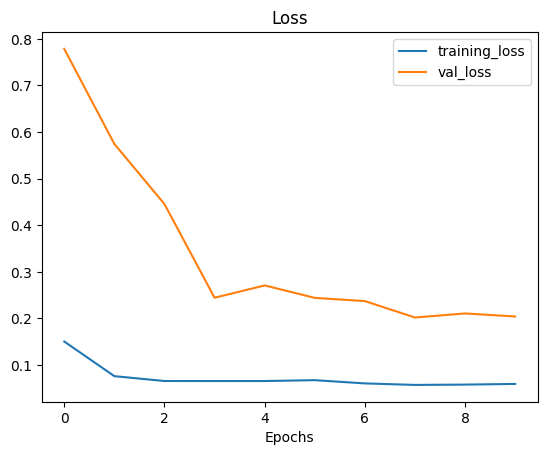

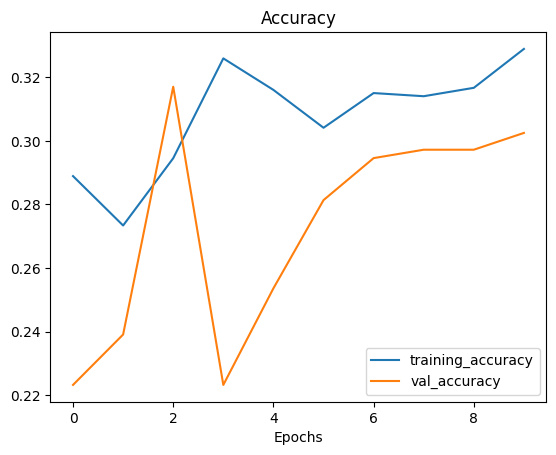

In [ ]:
plot_loss_curves(history)

The two loss curves decrease but are far appart one another, which implies there is still room for improvment.
Our accuracy is lower than before, so maybe data augmentation was not a good idea, or something went wrong during fine tuning.

### Another network : VGG16

I have tried to build a new architecture, based on VGG16, just to see if performance can be improved by using other methods.

The following code was inspired by this [article](https://pyimagesearch.com/2020/10/05/object-detection-bounding-box-regression-with-keras-tensorflow-and-deep-learning/).

We will be using the first dataframe that we created, that has no undistortionn or data augmentation, as the cause of the poor performances might be the result of the wrong implementation of one of these steps.

In [ ]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

In [ ]:
data = []
targets = []
filenames = []

# loop over the rows
for i in range (0,len(apriltag_df)):

    row = apriltag_df.iloc[i]
    imagePath = row['image_path']
    image = cv2.imread(imagePath)
    (height, width) = image.shape[:2]
    # scale the bounding box coordinates relative to the spatial

    upper_left_x = float(row['upper_left_x'])/width
    upper_left_y = float(row['upper_left_y'])/height
    upper_right_x = float(row['upper_right_x'])/width
    upper_right_y = float(row['lower_right_x'])/height
    lower_right_x = float(row['lower_right_x'])/width
    lower_right_y = float(row['lower_right_y'])/height
    lower_left_x = float(row['lower_left_x'])/width
    lower_left_y = float(row['lower_left_y'])/height

      # load the image and preprocess it
    image = load_img(imagePath, target_size=(224, 224))
    image = img_to_array(image)
    # update our list of data, targets, and filenames
    data.append(image)
    targets.append((upper_left_x, upper_left_y, upper_right_x, upper_right_y, lower_right_x, lower_right_y, lower_left_x, lower_left_y))
    filenames.append(apriltag_df['image_id'])

 # convert the data and targets to NumPy arrays, scaling the input
# pixel intensities from the range [0, 255] to [0, 1]
data = np.array(data, dtype="float32") / 255.0
targets = np.array(targets, dtype="float32")
# partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, filenames, test_size=0.10,
	random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]

In [ ]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = tf.keras.applications.VGG16(weights="imagenet", include_top=False,
	input_tensor = tf.keras.layers.Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = tf.keras.layers.Flatten()(flatten)
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = tf.keras.layers.Dense(128, activation="relu")(flatten)
bboxHead = tf.keras.layers.Dense(64, activation="relu")(bboxHead)
bboxHead = tf.keras.layers.Dense(32, activation="relu")(bboxHead)
bboxHead = tf.keras.layers.Dense(8, activation="sigmoid")(bboxHead)
# construct the model we will fine-tune for bounding box regression
model = tf.keras.layers.Model(inputs=vgg.input, outputs=bboxHead)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
#compile the model
model.compile(loss="mse",metrics=['accuracy'], optimizer= tf.keras.optimizers.Adam(learning_rate=0.001))

In [ ]:
# train
history = model.fit(
	trainImages, trainTargets,
	validation_data=(testImages, testTargets),
	batch_size=32,
	epochs=5,
	verbose=1)

Epoch 1/5
107/107 [==============================] - 36s 192ms/step - loss: 0.0399 - accuracy: 0.3021 - val_loss: 0.0172 - val_accuracy: 0.4063
Epoch 2/5
107/107 [==============================] - 15s 139ms/step - loss: 0.0081 - accuracy: 0.4282 - val_loss: 0.0078 - val_accuracy: 0.3404
Epoch 3/5
107/107 [==============================] - 15s 143ms/step - loss: 0.0053 - accuracy: 0.4470 - val_loss: 0.0069 - val_accuracy: 0.4037
Epoch 4/5
107/107 [==============================] - 17s 157ms/step - loss: 0.0056 - accuracy: 0.4461 - val_loss: 0.0073 - val_accuracy: 0.4037
Epoch 5/5
107/107 [==============================] - 17s 163ms/step - loss: 0.0044 - accuracy: 0.4581 - val_loss: 0.0057 - val_accuracy: 0.4063


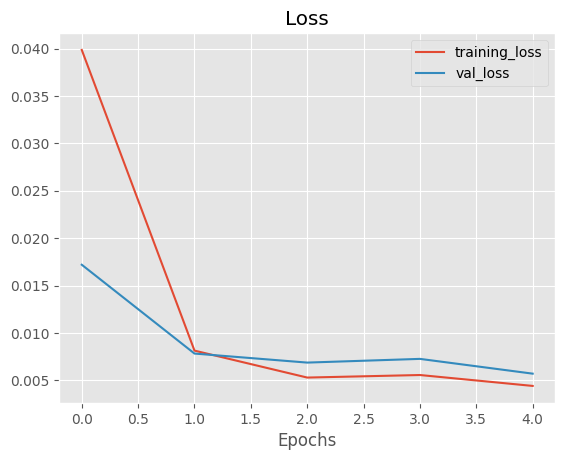

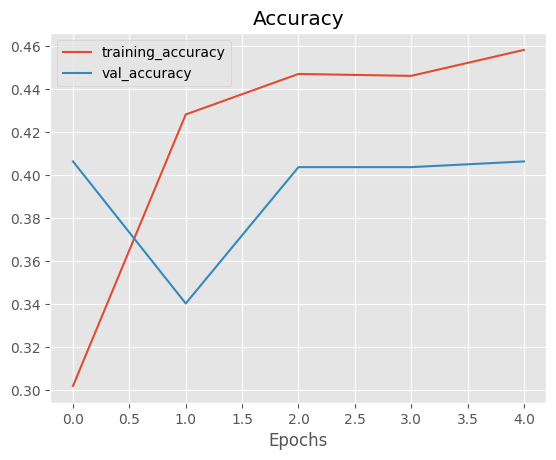

In [ ]:
plot_loss_curves(history)

Our loss curves are pretty close and our accuracy is increasing, which looks a lot better than the curves we obtained with ResNet50. Howerver our training accuracy is higher than on the test data, which means that we have probably induced some overfitting. Some data augmentation or a simpler architecture with less Dense layers at the end of the model could resolve this issue.

###First ResNet50 implementation

The reason why i tried to pursue ResNet50 is because on my first trials, these are the results I obtained using ResNet50, which seeme retty encouraging. Nevertheless, I never managed to obtain similar results again.

I have kept this results and decided to show them to justify why I tried to pursue this method.

In [ ]:
apriltag_df_normalized.head()

,image_id,image_path,upper_left_x,upper_left_y,upper_right_x,upper_right_y,lower_right_x,lower_right_y,lower_left_x,lower_left_y
0,img_001112.png,/content/images/img_001112.png,0.301697,0.376363,0.325806,0.383811,0.324528,0.438293,0.299559,0.435116
1,img_003514.png,/content/images/img_003514.png,0.386410,0.372044,0.496669,0.316507,0.538044,0.461446,0.429039,0.518126
2,img_002261.png,/content/images/img_002261.png,0.404976,0.361640,0.629694,0.330395,0.662991,0.637965,0.420647,0.670540
3,img_000046.png,/content/images/img_000046.png,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,img_001850.png,/content/images/img_001850.png,0.570228,0.315352,0.646274,0.318638,0.653385,0.425115,0.576894,0.427568


dans un premier temps on transforme notre datafram pour garder xmin xmax et ymin ymax.

In [ ]:
apriltag_df_x_values =  apriltag_df_normalized.drop(['image_path','upper_left_y','upper_right_y','lower_right_y','lower_left_y'], axis = 1)
apriltag_df_y_values =  apriltag_df_normalized.drop(['image_path','upper_left_x','upper_right_x','lower_right_x','lower_left_x'], axis = 1)

In [ ]:
apriltag_df_x_min_max_no_id = pd.DataFrame({'min_x': apriltag_df_x_values.iloc[:, 1:].min(axis=1), 'max_x': apriltag_df_x_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_x_min_max = pd.concat([apriltag_df_x_values['image_id'], apriltag_df_x_min_max], axis=1)
apriltag_df_x_min_max.head()

,image_id,min_x,max_x
0,img_001112.png,0.299559,0.325806
1,img_003514.png,0.386410,0.538044
2,img_002261.png,0.404976,0.662991
3,img_000046.png,0.000000,0.000000
4,img_001850.png,0.570228,0.653385


In [ ]:
apriltag_df_y_min_max_no_id = pd.DataFrame({'min_y': apriltag_df_y_values.iloc[:, 1:].min(axis=1), 'max_y': apriltag_df_y_values.iloc[:, 1:].max(axis=1)})

# Combine with the ID column
apriltag_df_y_min_max = pd.concat([apriltag_df_y_values['image_id'], apriltag_df_y_min_max_no_id], axis=1)
apriltag_df_y_min_max.head()

,image_id,min_y,max_y
0,img_001112.png,0.376363,0.438293
1,img_003514.png,0.316507,0.518126
2,img_002261.png,0.330395,0.670540
3,img_000046.png,0.000000,0.000000
4,img_001850.png,0.315352,0.427568


In [ ]:
apriltag_df_xy_min_max = pd.concat([apriltag_df_x_min_max, apriltag_df_y_min_max.iloc[:, 1:]],axis=1)
apriltag_df_xy_min_max.head()

,image_id,min_x,max_x,min_y,max_y
0,img_001112.png,0.299559,0.325806,0.376363,0.438293
1,img_003514.png,0.386410,0.538044,0.316507,0.518126
2,img_002261.png,0.404976,0.662991,0.330395,0.670540
3,img_000046.png,0.000000,0.000000,0.000000,0.000000
4,img_001850.png,0.570228,0.653385,0.315352,0.427568


In [ ]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
#from tensorflow.keras.applications import FasterRCNN
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Split the dataset into training and validation sets
train_data, val_data = train_test_split(apriltag_df_xy_min_max, test_size=0.2)

# Define a data generator that generates batches of training and validation data
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_data,
    directory= image_folder_path,
    x_col='image_id',
    y_col=['min_x', 'max_x', 'min_y', 'max_y'],
    class_mode='raw',
    batch_size=32,
    target_size=(224, 224)
)

# Load a pre-trained Faster R-CNN model and remove its classification layer
base_model = tf.keras.applications.ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
x = base_model.layers[-1].output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Add a new regression layer to the model that outputs the predicted bounding box coordinates
x = Dense(4, activation='linear')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=x)

# Freeze the layers of the pre-trained model so that only the new regression layer is trainable
for layer in base_model.layers:
    layer.trainable = False

# Compile the model using a suitable loss function and optimizer
model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['accuracy','mse'])

# Train the model on the training set
history = model.fit(train_generator, epochs=10, validation_data=val_generator)

Found 3025 validated image filenames.
Found 757 validated image filenames.


Epoch 1/10
95/95 [==============================] - 29s 265ms/step - loss: 0.0661 - accuracy: 0.2962 - mse: 0.0661 - val_loss: 0.0490 - val_accuracy: 0.2933 - val_mse: 0.0490
Epoch 2/10
95/95 [==============================] - 24s 252ms/step - loss: 0.0486 - accuracy: 0.3693 - mse: 0.0486 - val_loss: 0.0459 - val_accuracy: 0.3025 - val_mse: 0.0459
Epoch 3/10
95/95 [==============================] - 26s 277ms/step - loss: 0.0438 - accuracy: 0.3663 - mse: 0.0438 - val_loss: 0.0390 - val_accuracy: 0.3474 - val_mse: 0.0390
Epoch 4/10
95/95 [==============================] - 24s 254ms/step - loss: 0.0394 - accuracy: 0.4043 - mse: 0.0394 - val_loss: 0.0367 - val_accuracy: 0.3989 - val_mse: 0.0367
Epoch 5/10
95/95 [==============================] - 23s 239ms/step - loss: 0.0368 - accuracy: 0.4281 - mse: 0.0368 - val_loss: 0.0351 - val_accuracy: 0.4135 - val_mse: 0.0351
Epoch 6/10
95/95 [==============================] - 23s 246ms/step - loss: 0.0357 - accuracy: 0.4331 - mse: 0.0357 - val_loss

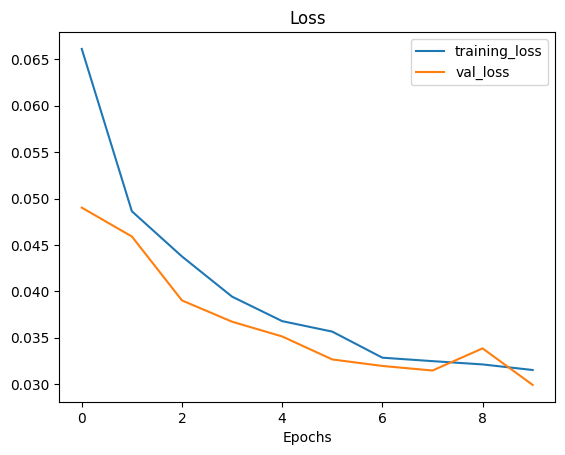

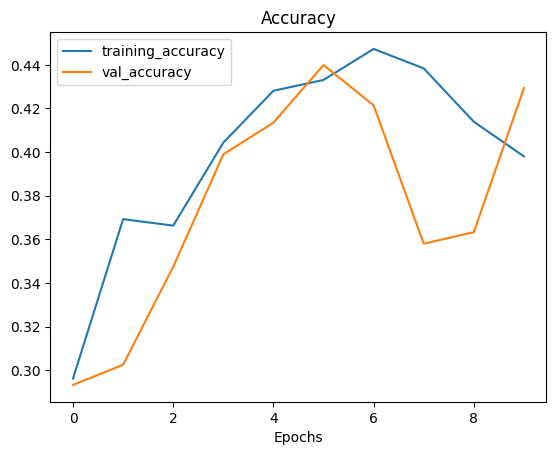

In [ ]:
plot_loss_curves(history)

As we can see here, our loss curves decreazse together, and our accuracies also seem pretty close, and the perfomance is one of the best I have been able to obtain.

In [ ]:
image_test = load_and_preprocess_image('/content/images/img_000482.png', True)
prediction = model.predict(np.array([image_test]))

1/1 [==============================] - 0s 42ms/step


In [ ]:
prediction[0][0] *=720
prediction[0][1] *=720
prediction[0][2] *=540
prediction[0][3] *=540
prediction

array([[286.1102 , 358.01755, 138.0155 , 227.36023]], dtype=float32)

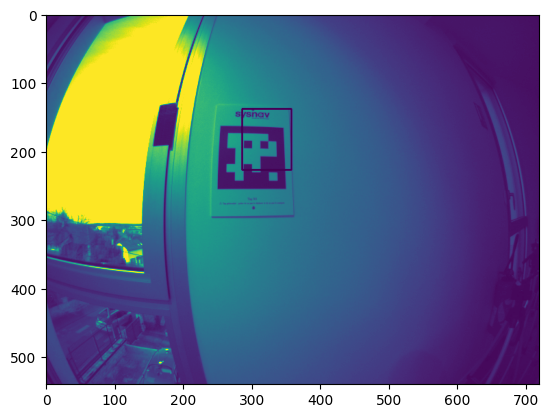

In [ ]:
img = cv2.imread('/content/images/img_000482.png', cv2.IMREAD_GRAYSCALE)
# Draw the bounding box on the image
xmin, ymin, xmax, ymax = prediction[0][0], prediction[0][2], prediction[0][1], prediction[0][3]
cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)

# Display the image
plt.imshow(img)
plt.show()


The bounding box is not accurate, but the size is better compared to the model we used in the first part, and its location isn't absurd.

Now let's try to do this on multiple images :

In [ ]:
#getting the real pixel values for all the images
apriltag_df_bis = pd.concat([apriltag_df_xy_min_max, apriltag_df['image_path']],axis=1)
apriltag_df_bis['min_x']*=720
apriltag_df_bis['max_x']*=720
apriltag_df_bis['min_y']*=540
apriltag_df_bis['max_y']*=540

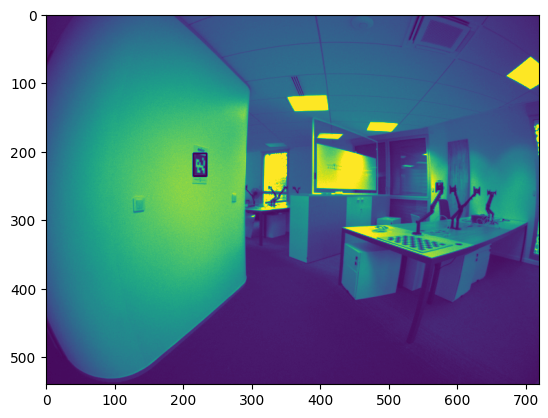

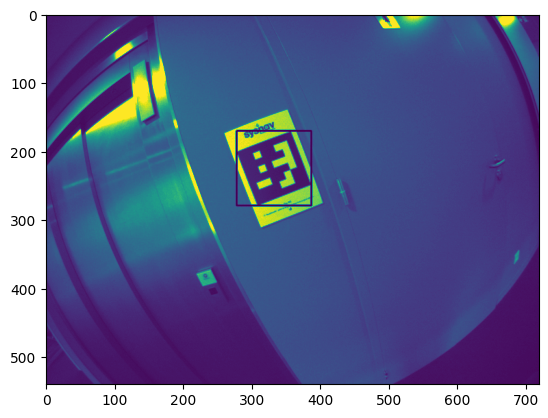

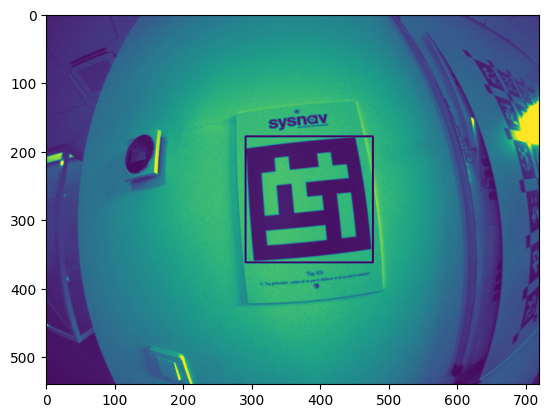

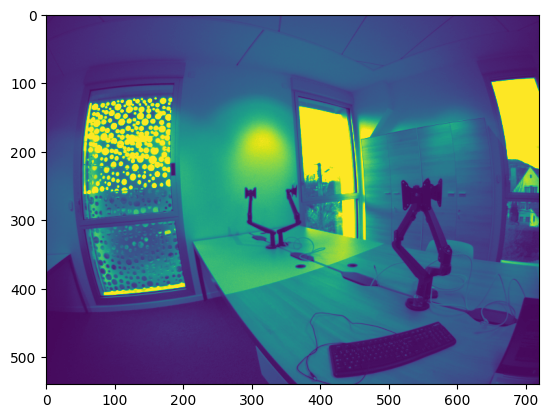

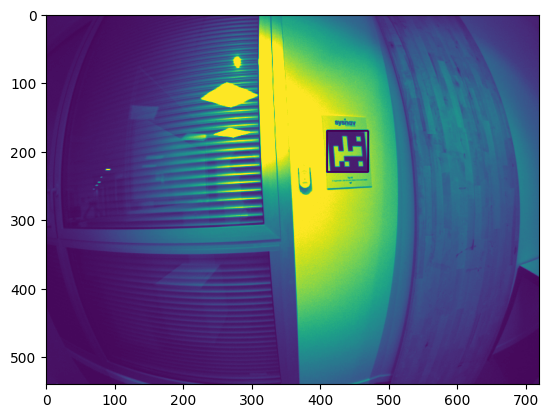

...

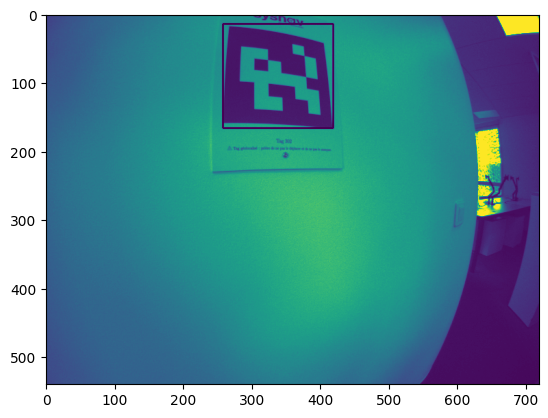

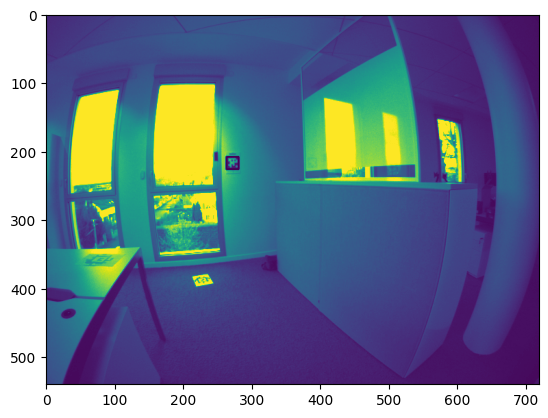

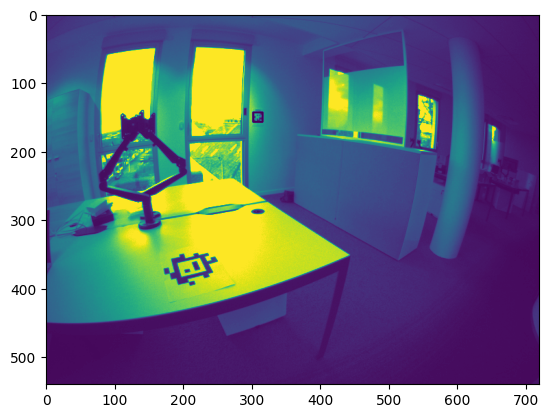

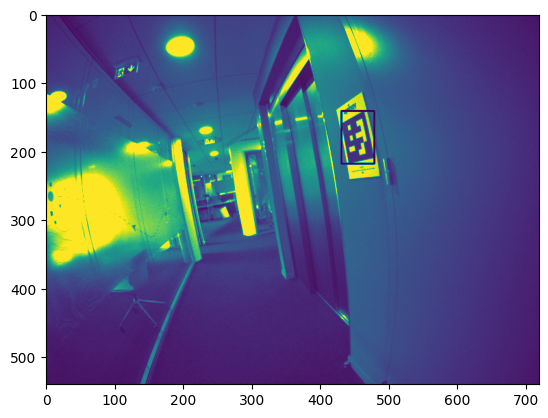

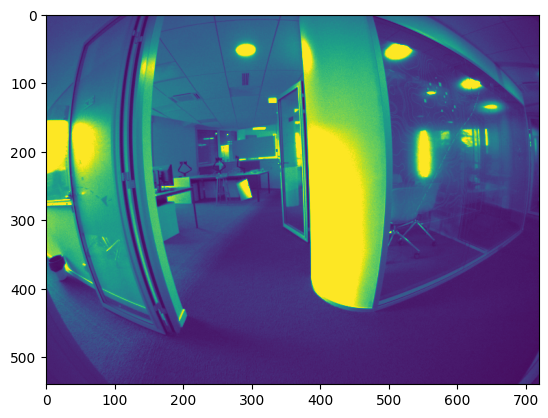

KeyboardInterrupt: ignored

In [ ]:
# Loop through the images and draw bounding boxes on them
for i, row in apriltag_df_bis.iterrows():
    # Load the image
    img = cv2.imread(row['image_path'], cv2.IMREAD_GRAYSCALE)
    # Draw the bounding box on the image
    xmin, ymin, xmax, ymax = row['min_x'], row['min_y'], row['max_x'], row['max_y']
    cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)

    # Display the image
    plt.imshow(img)
    plt.show()

